# What is this workshop about?

1. The three APIs of TensorFlow 2
2. Airbnb price regressions
3. Getting insights from gradients

## How to run the notebook?

* The notebook can be run on Google Colab or a Jupyter Notebook 
* https://github.com/yaniv256/workshops/blob/master/notebooks/TF2-intro-Airbnb.ipynb
* Or web search Colab, go to the `Github` tab, enter `yaniv256`, pick the `workshops` repository, and pick the `TF2-intro-Airbnb.ipynb` notebook.

## Why TensorFlow 2?

Resistance is futile
* TF2 freely copied the best of PyTorch
* Keras was assimilated
* Still most popular (according to [Google trends](https://trends.google.com/trends/explore?date=today%205-y&geo=US&q=TensorFlow,PyTorch,Keras))


## The three APIs

1. Sequencial: when all you need is a stack of layers
2. Functional: when you want to connect layers in whatever way
3. Subclassing: Object Oriented + connect on input

And there's also TensorFlow itself - good for any symbolic computation.

Example: Sequencial API

In [1]:
import tensorflow.keras as keras

def build_model_sequential(input_shape, activation='relu', width=128):

    model = keras.Sequential()
    model.add(keras.layers.Dense(width, activation=activation,
                                 input_shape=input_shape))
    model.add(keras.layers.Dense(width, activation=activation))
    model.add(keras.layers.Dense(1))

    return model

Example: Functional API

In [2]:
import tensorflow.keras as keras

def build_model_functional(input_shape, activation='relu', width=128):

    inputs = keras.Input(shape=input_shape)
    x = keras.layers.Dense(width, activation=activation)(inputs)
    x = keras.layers.Dense(width, activation=activation)(x)
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)

    return model

Example: Subclassing API

In [3]:
def build_model_subclassing(activation='relu', width=128):

    class MyModel(keras.Model):
        def __init__(self):
            super(MyModel, self).__init__()
            self.dense1 = keras.layers.Dense(width, activation=activation)
            self.dense2 = keras.layers.Dense(width, activation=activation)
            self.out = keras.layers.Dense(1)

        def call(self, x):
            x = self.dense1(x)
            x = self.dense2(x)
            return self.out(x)

    model = MyModel()

    return model

## Which API should you learn?

* Sequecial is good enough for most tasks
* Same code in Functional is just as short and clear


* If you want to build reusable objects go for Subclassing
* Otherwise, Functional is as powerful and more readable

We'll talk about this more with code examples...

## Airbnb price regressions

* Predict a listings price based on its features
* Valuate listings
* Valuate locations

## Valuation vs. prediction

* Making a best prediction isn't the same as estimating value
* Many listings are overpriced
* Lots of reviews indicate price is low relative to listing value

## Insight from gradients

* What is the sensitivity of a prediction to each input variable?
* Which variables are most important?
* How to examine non-linearities and interactions?

Answer to all: gradients.

# Airbnb Price Regression

Data source: http://insideairbnb.com/index.html

## Load Twin Cities data

In [4]:
%%writefile airbnbloader.py
from collections import OrderedDict
import pandas as pd
from datetime import datetime
import numpy as np


def load(date='2019-06-02', location='united-states/mn/twin-cities-msa'):

    filename = (
        'http://data.insideairbnb.com/{}/{}/data/listings.csv.gz'.format(
            location, date))

    data = pd.read_csv(filename)

    data.price = data.price.apply(lambda x: float(x[1:].replace(',', '')))

    weekday = data.last_review.dropna().apply(
      lambda x: datetime.strptime(x, '%Y-%m-%d').strftime('%A'))
    weekday.name = 'last_review_weekday'
    data = data.join(weekday)

    days_since_last_review = data.last_review.dropna().apply(
        lambda x: (datetime.strptime(date, '%Y-%m-%d')
                   - datetime.strptime(x, '%Y-%m-%d')).days)
    days_since_last_review.name = 'days_since_last_review'
    data = data.join(days_since_last_review)

    features = data[[
        'price',
        'latitude',
        'longitude',
        'room_type',
        'accommodates',
        'bathrooms',
        'bedrooms',
        'beds',
        'minimum_nights',
        'days_since_last_review',
        'number_of_reviews',
        'reviews_per_month',
        'calculated_host_listings_count',
        'availability_30',
        'availability_365'
        ]]

    features.dropna(inplace=True)
    features = features[features.availability_365 != 0]
    features = features[features.availability_365 != 365]

    onehot_room_type = pd.get_dummies(features['room_type'])

    onehot_room_type.drop(['Private room'], axis=1, inplace=True)

    features = pd.concat([features, onehot_room_type], axis=1)

    targets = features['price'].apply(lambda x: np.log(x+1))

    features.drop(['price', 'room_type'], axis=1, inplace=True)

    return features, targets, data


def all_value_counts(data, n=5):

    return OrderedDict(
        (field,
         dict(n=len(set(data[field])),
              top=list(zip(
                  data[field].value_counts().head(n).index,
                  data[field].value_counts().head(n).values))))
        for field in data.columns)

Overwriting airbnbloader.py


In [5]:
import importlib
import warnings
import airbnbloader

warnings.filterwarnings('ignore')
importlib.reload(airbnbloader)

# Some dates that are available for
# location='united-states/mn/twin-cities-msa':
# last June: date='2019-06-02'
# last January: date='2020-01-04'
# most recent: date='2020-04-14'

features, targets, data = airbnbloader.load(
    location='united-states/mn/twin-cities-msa',
    date='2019-06-02'
)

features.shape, targets.shape, data.shape

((2951, 15), (2951,), (6607, 108))

Split to train and test data sets.

In [6]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    features,
    targets,
    test_size=0.25,
    random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2213, 15), (738, 15), (2213,), (738,))

Uncomment to take a peek at the data.

In [7]:
import pandas as pd

# pd.options.display.max_rows = 200
# pd.DataFrame(data.isna().mean().sort_values(ascending=False),
#              columns = ['NA rate'])

In [8]:
# airbnbloader.all_value_counts(features)

## Map listings

In [9]:
%%writefile mapairbnb.py
import plotly.graph_objects as go


def plot(data, features, color_by, color_title, zoom=10, hover=True,
         center=dict(lat=44.981944, lon=-93.269167)):

    data_ = data.loc[features.index]

    if hover:
        text = [
            '{}  <br> ${}'.format(data_.name[i], data_.price[i])
            + '<br>Number of reviews: {}<br>'.format(
                data_.number_of_reviews[i])
            + ' <a href="{}">link</a>'.format(
                data_.listing_url[i])
            + '<br>Availability: {}'.format(data_.availability_365[i])
            + '<br>Days since last review: {}'.format(
                features.days_since_last_review[i])
            + '<br>Accommodates: {}'.format(features.accommodates[i])
            for i in data_.index]
    else:
        text = ''

    fig = go.Figure(go.Scattermapbox(
        lat=features.latitude,
        lon=features.longitude,
        mode='markers',
        text=text,
        hoverinfo='text',
        marker=dict(color=color_by, colorscale='rainbow',
                    colorbar=dict(title=color_title), size=9),
        ))

    fig.update_layout(
        hovermode='x',
        hoverdistance=20,
        mapbox_style='white-bg',
        autosize=False,
        width=800,
        height=400,
        mapbox_layers=[{
            'below': 'traces', 'sourcetype': 'raster',
            'source': ['https://basemap.nationalmap.gov/arcgis/rest/services/'
                       + 'USGSImageryOnly/MapServer/tile/{z}/{y}/{x}']}],
        mapbox=dict(bearing=0, center=center, pitch=0, zoom=zoom),
        )

    fig.update_layout(margin={'r': 0, 't': 0, 'l': 0, 'b': 0})

    return fig

Overwriting mapairbnb.py


In [10]:
import mapairbnb

importlib.reload(mapairbnb)

mapairbnb.plot(data, features, color_by=targets, color_title='Log price')

## OLS Regression

In [11]:
import statsmodels.api as sm
import pandas as pd

X_train_with_const = sm.add_constant(
    pd.DataFrame(X_train, columns=features.columns))
X_test_with_const = sm.add_constant(
    pd.DataFrame(X_test, columns=features.columns))

results = sm.OLS(y_train, X_train_with_const).fit(cov_type='HC0')

print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.602
Model:                            OLS   Adj. R-squared:                  0.599
Method:                 Least Squares   F-statistic:                     225.5
Date:                Tue, 19 May 2020   Prob (F-statistic):               0.00
Time:                        06:53:54   Log-Likelihood:                -1952.4
No. Observations:                2213   AIC:                             3937.
Df Residuals:                    2197   BIC:                             4028.
Df Model:                          15                                         
Covariance Type:                  HC0                                         
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

## Map overpricing

Since reviews indicate lower prices relative to the value of the listing we need to fix the review variables on some constant values when producing valuations. We replace every reviews-related variable with its median.

In [12]:
features.median()

latitude                           44.95976
longitude                         -93.26204
accommodates                        4.00000
bathrooms                           1.00000
bedrooms                            1.00000
beds                                2.00000
minimum_nights                      2.00000
days_since_last_review             19.00000
number_of_reviews                  18.00000
reviews_per_month                   1.39000
calculated_host_listings_count      2.00000
availability_30                    10.00000
availability_365                  173.00000
Entire home/apt                     1.00000
Shared room                         0.00000
dtype: float64

In [13]:
%%writefile fixcolumns.py
import numpy as np
import pandas as pd


def fix(data, fix_columns, fix_on):

    all_fixed = pd.DataFrame(
        np.tile(fix_on, (len(data), 1)),
        columns=data.columns)

    all_fixed.index = data.index

    fixed_data = data.copy()

    fixed_data[fix_columns] = all_fixed[fix_columns]

    return fixed_data


Overwriting fixcolumns.py


In [14]:
import fixcolumns
importlib.reload(fixcolumns)

fix_reviews = fixcolumns.fix(
    data=features,
    fix_columns=[
        'days_since_last_review',
        'number_of_reviews',
        'reviews_per_month'],
    fix_on=features.median().values
    )

fix_reviews.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Shared room
0,45.00886,-93.23407,5,1.0,1.0,2.0,2,19.0,18.0,1.39,2,15,165,1,0
1,44.94566,-93.35721,5,1.0,2.0,2.0,2,19.0,18.0,1.39,1,28,363,0,0
2,44.91878,-93.23038,3,1.0,2.0,2.0,2,19.0,18.0,1.39,2,8,341,0,0
3,44.92053,-93.35049,3,1.0,1.0,1.0,2,19.0,18.0,1.39,2,0,335,1,0
7,44.92136,-93.22873,3,1.0,2.0,2.0,2,19.0,18.0,1.39,2,7,340,0,0


Now we can use the review-constant listings to estimate the "right" price for listings and compare that to what it is listed for. 

In [15]:
ols_predicted = results.predict(
    sm.add_constant(fix_reviews, has_constant='add'))
overpriced = targets-ols_predicted
mapairbnb.plot(
    data, features, color_by=overpriced, color_title='Diff log price')

## Location, location, location!

To see the effect of location we need to hold everything else fixed. One approach is to pick the median value for everything other than location and use that to make predictions.

In [16]:
location_only = fixcolumns.fix(
    data=features,
    fix_columns=features.columns[2:],
    fix_on=features.describe().loc['50%'].values
    )

location_only.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Shared room
0,45.00886,-93.23407,4.0,1.0,1.0,2.0,2.0,19.0,18.0,1.39,2.0,10.0,173.0,1.0,0.0
1,44.94566,-93.35721,4.0,1.0,1.0,2.0,2.0,19.0,18.0,1.39,2.0,10.0,173.0,1.0,0.0
2,44.91878,-93.23038,4.0,1.0,1.0,2.0,2.0,19.0,18.0,1.39,2.0,10.0,173.0,1.0,0.0
3,44.92053,-93.35049,4.0,1.0,1.0,2.0,2.0,19.0,18.0,1.39,2.0,10.0,173.0,1.0,0.0
7,44.92136,-93.22873,4.0,1.0,1.0,2.0,2.0,19.0,18.0,1.39,2.0,10.0,173.0,1.0,0.0


In [17]:
import numpy as np

location_predicted = results.predict(
    sm.add_constant(location_only, has_constant='add'))

mapairbnb.plot(data, features, color_by=np.exp(location_predicted),
               color_title='Predicted price', zoom=7, hover=False)

Faliure: a linear model can only generate linear maps, but location isn't linear.

# TensorFlow 2

Coding with TensorFlow is very similar to coding with Numpy, you just have to use TensorFlow functions instead of Numpy functions. The difference is that TensorFlow functions enable symbolic calculations, like taking derivatives. 


## Custom metric: $R^2$


Let's write a function calculating $R^2$ in TensorFlow. Recall that 

$$R^2=1-\frac{\Sigma (y-\hat{y})^2}{\Sigma (y-\bar{y})^2}$$


TensorFlow doesn't provide an $R^2$ metric. There are probably two reasons for that:

1. $R^2$ computed on each batch is a downward biased estimate of whole epoch $R^2$, because of the division by batch variance.
2. Even correcting for the bias, the average $R^2$ of batches will not be exactly the $R^2$ of the whole epoch.

We can somewhat adjust for the first issue with the usual small sample bias correction, and we can live with the second issue.

$$\tilde{R}^2=1-\frac{\Sigma (y-\hat{y})^2}{\frac{n}{n-1}\Sigma (y-\bar{y})^2}$$



In [18]:
%%writefile tf_r2.py
import tensorflow as tf


def R_squared(y_true, y_pred):

    # TensorFlow uses 'float32' as the default type and often raises an error
    # when you mix 'float32' and 'float64' in calculations. Since 'float64' is
    # the Python and Numpy default, this happens a lot. Casting everything to
    # 'float32' is your best option.

    y_true = tf.cast(y_true, 'float32')
    y_pred = tf.cast(y_pred, 'float32')

    residual_var = tf.reduce_sum(tf.square(y_true - y_pred))
    total_var = tf.reduce_sum(tf.square(y_true - tf.reduce_mean(y_true)))

    # Adjust for small batch bias
    n = tf.cast(tf.size(y_true), 'float32')
    total_var *= n/(n-1)

    return (1.0 - residual_var/total_var)

Overwriting tf_r2.py


Tensorflow functions produce tensors which are only computed when you call `.numpy()` on them.

In [19]:
import numpy as np
import tf_r2

importlib.reload(tf_r2)

OLS_r2 = dict(
    Train=tf_r2.R_squared(
        y_train,
        results.predict(X_train_with_const)
        ).numpy(),
    Test=tf_r2.R_squared(
        y_test,
        results.predict(X_test_with_const)
        ).numpy()
    )

pd.DataFrame(pd.Series(OLS_r2), columns=['OLS R2']).transpose()

,Train,Test
OLS R2,0.601956,0.540067


## Add dropout

Here is the same simple network with dropout implemented using the three APIs.

In [20]:
%%writefile simple_dnn.py

import tensorflow.keras as keras
from tf_r2 import R_squared

# The sequencial API: create one layer at a time and add it to the model.
# We don't have to provide the shape of the input, but if we don't the
# construction of the model will be delayed until the first call to `fit()`


def build_model_sequential(
        input_shape=None,
        dropout=0.2,
        activation='relu',
        width=128,
        n_hidden=2):

    model = keras.Sequential()
    for i in range(n_hidden):
        if i == 0 and input_shape:
            model.add(keras.layers.Dense(width,
                                         activation=activation,
                                         input_shape=input_shape))
        else:
            model.add(keras.layers.Dense(width, activation=activation))
        model.add(keras.layers.Dropout(dropout))
    model.add(keras.layers.Dense(1))

    return model

# The functional API: create layers and apply them, all before input.
# We have to provide the shape of the input to `keras.Input`.


def build_model_functional(
        input_shape,
        dropout=0.2,
        activation='relu',
        width=128,
        n_hidden=2):

    inputs = keras.Input(shape=input_shape)
    x = inputs
    for i in range(n_hidden):
        x = keras.layers.Dense(width, activation=activation)(x)
        x = keras.layers.Dropout(dropout)(x)
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)

    return model

# The subclassing API: create layers and store them, apply only on input.
# We don't need to provide the shape of the input.


def build_model_subclassing(
        dropout=0.2,
        activation='relu',
        width=128,
        n_hidden=2):

    class MyModel(keras.Model):
        def __init__(self):
            super(MyModel, self).__init__()
            self.dense = []
            self.dropout = []
            for i in range(n_hidden):
                self.dense.append(
                    keras.layers.Dense(
                        width, activation=activation))
                self.dropout.append(keras.layers.Dropout(dropout))
            self.out = keras.layers.Dense(1)

        def call(self, x):
            for i in range(n_hidden):
                x = self.dense[i](x)
                x = self.dropout[i](x)
            return self.out(x)

    model = MyModel()

    return model

# Training is the same for all


def train_model(model, X_train, y_train, X_test, y_test, 
                optimizer=keras.optimizers.SGD(0.025)):
    
    model.compile(loss='mse',
                  optimizer=optimizer,
                  metrics=[R_squared])

    batch_size = 32

    # Trim data to whole multiple of batch size so that R2 doesn't encounter
    # very small batches at the end of an epoch
    X_train = X_train[:-(len(X_train) % batch_size)]
    y_train = y_train[:-(len(y_train) % batch_size)]
    X_test = X_test[:-(len(X_test) % batch_size)]
    y_test = y_test[:-(len(y_test) % batch_size)]

    early_stopping = keras.callbacks.EarlyStopping(
        patience=30,
        restore_best_weights=True)

    history = model.fit(
        X_train,
        y_train,
        batch_size=batch_size,
        epochs=1000,
        validation_data=(X_test, y_test),
        callbacks=[early_stopping]
    )

    return history


Overwriting simple_dnn.py


You can't ask for `summary()` when not providing input_shape as the layers only 
get built on the first input. There used to be a `build(input_shape)` method, but it has been deprecated.

In [21]:
import simple_dnn

importlib.reload(simple_dnn)

simple_dnn.build_model_sequential(X_train.shape[1:]).summary()
simple_dnn.build_model_functional(X_train.shape[1:]).summary()

# keras_dnn.build_model_sequential().summary()  # will not work
# keras_dnn.build_model_subclassing().summary() # will not work

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               2048      
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 129       
Total params: 18,689
Trainable params: 18,689
Non-trainable params: 0
_________________________________________________________________
Model: "model"
_________________________________________________________________
Layer (type)                 Output S

In [22]:
from sklearn import preprocessing
import simple_dnn

importlib.reload(simple_dnn)

scaler = preprocessing.StandardScaler().fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# model = simple_dnn.build_model_sequential()
# model = simple_dnn.build_model_sequential(X_train.shape[1:])
model = simple_dnn.build_model_functional(X_train.shape[1:])
# model = simple_dnn.build_model_subclassing()

history = simple_dnn.train_model(
    model,
    X_train_scaled, y_train.values,
    X_test_scaled, y_test.values)

Train on 2208 samples, validate on 736 samples
Epoch 1/1000
2208/2208 [==============================] - 0s 224us/sample - loss: 1.7120 - R_squared: -1.0298 - val_loss: 0.6061 - val_R_squared: 0.1964
Epoch 2/1000
2208/2208 [==============================] - 0s 41us/sample - loss: 0.6434 - R_squared: 0.2194 - val_loss: 0.4305 - val_R_squared: 0.4354
Epoch 3/1000
2208/2208 [==============================] - 0s 46us/sample - loss: 0.5360 - R_squared: 0.3467 - val_loss: 0.3822 - val_R_squared: 0.5011
Epoch 4/1000
2208/2208 [==============================] - 0s 48us/sample - loss: 0.4843 - R_squared: 0.4184 - val_loss: 0.3667 - val_R_squared: 0.5217
Epoch 5/1000
2208/2208 [==============================] - 0s 55us/sample - loss: 0.4454 - R_squared: 0.4675 - val_loss: 0.3491 - val_R_squared: 0.5448
Epoch 6/1000
2208/2208 [==============================] - 0s 68us/sample - loss: 0.4282 - R_squared: 0.4866 - val_loss: 0.3459 - val_R_squared: 0.5538
Epoch 7/1000
2208/2208 [=====================

2208/2208 [==============================] - 0s 43us/sample - loss: 0.2674 - R_squared: 0.6817 - val_loss: 0.3236 - val_R_squared: 0.5868
Epoch 55/1000
2208/2208 [==============================] - 0s 48us/sample - loss: 0.2843 - R_squared: 0.6533 - val_loss: 0.3186 - val_R_squared: 0.5952
Epoch 56/1000
2208/2208 [==============================] - 0s 44us/sample - loss: 0.2736 - R_squared: 0.6718 - val_loss: 0.3180 - val_R_squared: 0.5965
Epoch 57/1000
2208/2208 [==============================] - 0s 42us/sample - loss: 0.2713 - R_squared: 0.6775 - val_loss: 0.3253 - val_R_squared: 0.5886
Epoch 58/1000
2208/2208 [==============================] - 0s 39us/sample - loss: 0.2599 - R_squared: 0.6898 - val_loss: 0.3063 - val_R_squared: 0.6057
Epoch 59/1000
2208/2208 [==============================] - 0s 38us/sample - loss: 0.2737 - R_squared: 0.6796 - val_loss: 0.3093 - val_R_squared: 0.6019
Epoch 60/1000
2208/2208 [==============================] - 0s 46us/sample - loss: 0.2651 - R_squared: 

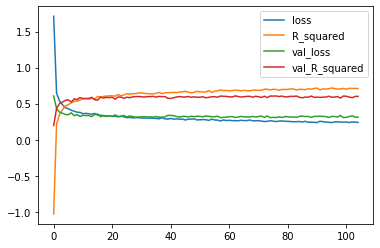

In [23]:
pd.DataFrame(history.history).plot()

## Performance

In [24]:
import tf_r2

importlib.reload(tf_r2)

DNN_r2 = dict(
    Train=tf_r2.R_squared(
        y_train, model.predict(X_train_scaled).flatten()
        ).numpy(),
    Test=tf_r2.R_squared(
        y_test, model.predict(X_test_scaled).flatten()
        ).numpy()
    )

pd.DataFrame([OLS_r2, DNN_r2], index=['OLS R2', 'DNN R2'])

,Train,Test
OLS R2,0.601956,0.540067
DNN R2,0.751206,0.617876


## Map overpricing

In [25]:
dnn_predicted = model.predict(scaler.transform(fix_reviews)).flatten()
overpriced = targets-dnn_predicted
mapairbnb.plot(data, features, color_by=overpriced, color_title='Diff log price')

## Location, location, location, again!



In [26]:
location_predicted = model.predict(scaler.transform(location_only)).flatten()

mapairbnb.plot(data, features, color_by=np.exp(location_predicted),
               color_title='Predicted price', zoom=8, hover=False)

Still a faliure but at least it's not linear anymore.

# Insight from gradients

In [27]:
import tensorflow as tf

X = tf.Variable(features.values, dtype='float32')

with tf.GradientTape() as tape:
    X_std = (X-scaler.mean_) / scaler.scale_
    predictions = model(X_std)

dnn_coefs = tape.gradient(predictions, X).numpy()

dnn_coefs = pd.DataFrame(dnn_coefs,
                         columns=features.columns,
                         index=features.index)
dnn_coefs.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Shared room
0,-0.594445,-0.073658,0.045101,-0.011653,0.108415,-0.080025,-0.002743,0.000889,-0.001027,-0.019005,-0.014760,0.018840,0.000700,0.771239,-0.310114
1,0.249064,0.550292,0.073442,0.010990,0.100084,-0.064770,-0.002704,0.000999,0.000216,-0.095858,-0.016685,0.011309,-0.000063,0.390041,-0.007525
2,-0.404723,-0.264892,0.033771,0.020160,0.096127,-0.027362,-0.006405,0.000349,0.000379,-0.055235,-0.010632,0.005204,0.000051,0.388487,-0.650715
3,1.170057,-0.059110,0.005928,0.359496,0.111174,0.101789,-0.025903,0.001097,-0.003508,-0.147064,0.038646,0.004358,0.001342,0.841204,-0.816997
7,0.975960,-0.844186,0.158518,-0.008360,0.261148,-0.022416,-0.030427,0.000096,-0.005684,-0.301037,-0.013873,0.016657,-0.000579,1.023957,-0.777530


## Compare with OLS

In [28]:
ols_coef = pd.Series(results.params[1::], name='OLS_coef')

dnn_mean_coef = pd.Series(dnn_coefs.mean(axis=0),
                          index=features.columns,
                          name='DNN_mean_grad')

pd.DataFrame([ols_coef, dnn_mean_coef]).transpose()

,OLS_coef,DNN_mean_grad
latitude,-0.135648,-0.111987
longitude,0.058068,0.070537
accommodates,0.046694,0.046564
bathrooms,0.195347,0.164667
bedrooms,0.112668,0.065642
beds,-0.022113,0.025082
minimum_nights,-0.005416,-0.012780
days_since_last_review,0.000704,0.000494
number_of_reviews,-0.000174,-0.002687
reviews_per_month,-0.068020,-0.126152


## Variable Importance

For each observation we can estimate the importance of each variable by multiplying the coefficients by the deviation of inputs from their mean.

In [29]:
# Approximate each variable's effect by multiplying its absolute deviation from
# its mean by the sensitivity of prediction to that variable.
abs_effect = (dnn_coefs * (features-features.mean())).abs()

# Compute per-row sum and reshape it to a vertical vector
abs_effect_sum = np.reshape(abs_effect.sum(axis=1).values, (len(features), 1))

# Divide by the sum so that effects sum to 1
per_obs_importance = abs_effect / abs_effect_sum

per_obs_importance.head()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,days_since_last_review,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_30,availability_365,Entire home/apt,Shared room
0,0.020930,0.002248,0.010684,0.006412,0.128747,0.066263,0.004175,0.005591,0.233282,0.005705,0.055074,0.086436,0.020280,0.349811,0.004361
1,0.011363,0.069360,0.016975,0.005900,0.010686,0.052326,0.004016,0.063389,0.030886,0.081448,0.081858,0.236661,0.014069,0.320960,0.000103
2,0.046469,0.013157,0.111971,0.015604,0.014798,0.031870,0.013712,0.038947,0.089217,0.047509,0.055808,0.032871,0.014296,0.460897,0.012873
3,0.044659,0.003425,0.006721,0.095147,0.063502,0.104039,0.018963,0.067643,0.023847,0.158850,0.069361,0.031162,0.123635,0.183518,0.005527
7,0.028997,0.012000,0.141822,0.001746,0.010848,0.007045,0.017578,0.008128,0.061271,0.278829,0.019649,0.036594,0.043541,0.327802,0.004151


Averaging across observations we have a measure of variable importance.

In [30]:
mean_abs_effect = per_obs_importance.mean().sort_values(ascending=False)

pd.DataFrame(
    mean_abs_effect/mean_abs_effect.sum(),
    columns=['Variable Importance'])

,Variable Importance
Entire home/apt,0.215004
reviews_per_month,0.112244
accommodates,0.104476
bathrooms,0.070883
availability_30,0.066916
bedrooms,0.064277
number_of_reviews,0.062268
availability_365,0.054676
beds,0.050167
calculated_host_listings_count,0.050039


## Error analysis

In [31]:
%%writefile erranalysis.py

import pandas as pd
import numpy as np


def table(predictions, targets, features, data, per_obs_importance, dnn_coefs,
          mean_abs_effect):

    pred = pd.Series(predictions.numpy().flatten(),
                     index=features.index,
                     name='pred')

    err = (pred - targets).sort_values()
    err.name = 'log pred - log price'

    error_analysis = (
        features.loc[err.index]
        .join(per_obs_importance.loc[err.index], rsuffix='_importance')
        .join(dnn_coefs.loc[err.index], rsuffix='_coef')
        )

    col = []
    for index in mean_abs_effect.index:
        col.append(index + '_importance')
        col.append(index + '_coef')
        col.append(index)
    col

    error_analysis = error_analysis.reindex(col, axis=1)
    error_analysis = (
        pd.DataFrame(data.name[err.index])
        .join('<a href="' + data.listing_url[err.index] + '">link</a>')
        .join(pred[err.index].apply(np.exp))
        .join(targets[err.index].apply(np.exp))
        .join(error_analysis)
        )

    return error_analysis


Writing erranalysis.py


In [32]:
from IPython.display import HTML
import erranalysis

importlib.reload(erranalysis)

error_analysis = erranalysis.table(
    predictions, targets, features, data, per_obs_importance, dnn_coefs,
    mean_abs_effect)

HTML(error_analysis.head().to_html(escape=False))

,name,listing_url,pred,price,Entire home/apt_importance,Entire home/apt_coef,Entire home/apt,reviews_per_month_importance,reviews_per_month_coef,reviews_per_month,accommodates_importance,accommodates_coef,accommodates,bathrooms_importance,bathrooms_coef,bathrooms,availability_30_importance,availability_30_coef,availability_30,bedrooms_importance,bedrooms_coef,bedrooms,number_of_reviews_importance,number_of_reviews_coef,number_of_reviews,availability_365_importance,availability_365_coef,availability_365,beds_importance,beds_coef,beds,calculated_host_listings_count_importance,calculated_host_listings_count_coef,calculated_host_listings_count,days_since_last_review_importance,days_since_last_review_coef,days_since_last_review,latitude_importance,latitude_coef,latitude,longitude_importance,longitude_coef,longitude,minimum_nights_importance,minimum_nights_coef,minimum_nights,Shared room_importance,Shared room_coef,Shared room
2461,Private apartment! Your own entrance & parking.,link,157.954544,10000.0,0.211656,0.589871,1,0.049271,-0.042177,3.18,0.006592,0.035176,5,0.124539,0.286093,1.0,0.300074,0.018823,27,0.007371,0.085143,2.0,0.003613,0.000146,61,0.087883,-0.000854,87,0.045343,0.122221,3.0,0.004631,0.001164,1,0.102896,0.001300,12.0,0.034527,-0.904030,44.94449,0.013423,0.563065,-93.28084,0.005152,0.004279,2,0.003029,-0.272230,0
4122,NE Mpls. Charmer,link,51.338257,801.0,0.301728,0.319841,0,0.046212,-0.031902,3.04,0.243701,0.059627,2,0.042737,0.051169,2.0,0.055222,0.006969,6,0.007504,-0.005649,1.0,0.047262,0.002692,49,0.069322,-0.000567,103,0.091601,0.038539,1.0,0.048887,-0.011713,2,0.015847,0.000158,20.0,0.003785,0.113848,45.00463,0.010553,0.404679,-93.23963,0.011795,-0.003741,1,0.003846,-0.244475,0
3107,Private Room in South Minneapolis,link,93.943459,1451.0,0.205116,0.621621,0,0.200908,-0.258539,0.51,0.139241,0.097400,2,0.035883,0.166680,1.0,0.147989,0.021544,25,0.015628,0.033637,1.0,0.079456,-0.004760,4,0.008512,0.000109,341,0.036831,0.044301,1.0,0.046108,-0.023437,1,0.018719,0.000657,33.0,0.022937,-1.008482,44.93689,0.016305,0.948595,-93.29148,0.021038,-0.019075,1,0.005330,-0.968698,0
1935,Private Bedroom - 1 to 2 Guests - Women Only,link,46.629002,601.0,0.299760,0.383915,0,0.007810,-0.082816,2.12,0.291919,0.086296,2,0.003668,0.007200,1.0,0.066473,0.004830,0,0.028276,0.025720,1.0,0.030397,0.000978,11,0.016686,-0.000256,133,0.001863,0.000947,1.0,0.140651,-0.030214,1,0.013459,-0.000286,50.0,0.062652,-0.608416,44.89595,0.003272,-0.170390,-93.27360,0.027124,-0.010393,1,0.005989,-0.459982,0
4987,Private Capitol-View Retreat in Vibrant Lowertown,link,283.513092,3501.0,0.172473,1.061050,1,0.008714,-0.072514,2.30,0.129424,-0.038767,12,0.374031,0.387669,3.5,0.092097,0.023208,20,0.003077,-0.006104,3.0,0.013847,-0.010282,34,0.074550,0.001132,329,0.078870,-0.031648,8.0,0.008377,0.004649,1,0.005078,-0.000131,6.0,0.002429,-0.171963,44.95133,0.021894,-0.286178,-93.09301,0.010588,-0.019412,2,0.004551,-0.902960,0


In [33]:
HTML(error_analysis.tail().to_html(escape=False))

,name,listing_url,pred,price,Entire home/apt_importance,Entire home/apt_coef,Entire home/apt,reviews_per_month_importance,reviews_per_month_coef,reviews_per_month,accommodates_importance,accommodates_coef,accommodates,bathrooms_importance,bathrooms_coef,bathrooms,availability_30_importance,availability_30_coef,availability_30,bedrooms_importance,bedrooms_coef,bedrooms,number_of_reviews_importance,number_of_reviews_coef,number_of_reviews,availability_365_importance,availability_365_coef,availability_365,beds_importance,beds_coef,beds,calculated_host_listings_count_importance,calculated_host_listings_count_coef,calculated_host_listings_count,days_since_last_review_importance,days_since_last_review_coef,days_since_last_review,latitude_importance,latitude_coef,latitude,longitude_importance,longitude_coef,longitude,minimum_nights_importance,minimum_nights_coef,minimum_nights,Shared room_importance,Shared room_coef,Shared room
5098,Minneapolis Apt by Bus Stop - 15 Min to Downtown!,link,495.498352,96.0,0.134669,1.454688,1,0.179183,-0.400174,0.35,0.000708,-0.014638,5,0.084128,0.749063,1.0,0.031663,-0.015869,19,0.040423,-0.166772,1.0,0.098641,-0.011327,4,0.042406,0.000979,351,0.116325,0.268199,1.0,0.154547,0.041338,19,0.051267,0.001356,232.0,0.058471,-3.229368,45.05011,0.002565,1.064340,-93.24850,0.001852,-0.040326,3,0.003153,1.098217,0
5227,Keystone Cougar RV:::will tow for you:::,link,193.159714,36.0,0.026504,0.127918,1,0.344924,-0.352528,0.39,0.024890,0.035523,6,0.167031,0.664506,1.0,0.010590,0.012222,10,0.005286,0.105738,2.0,0.168120,-0.008371,3,0.020150,0.000434,109,0.035121,0.043537,4.0,0.003673,-0.001599,1,0.102630,0.002435,18.0,0.042771,-2.616879,45.00930,0.011245,-1.625711,-93.24593,0.036551,-0.028385,1,0.000513,-0.079887,0
1970,Beautiful Townhouse,link,501.943573,91.0,0.005133,0.027106,1,0.252112,-0.239813,0.10,0.051956,0.043960,7,0.011212,0.273401,1.5,0.260850,0.029129,28,0.053620,-0.091317,3.0,0.148692,-0.007869,2,0.026859,-0.000499,88,0.016664,0.022601,4.0,0.028038,-0.013355,1,0.066634,0.000454,360.0,0.046617,-1.398324,45.04328,0.003729,-0.751457,-93.26677,0.026097,-0.022173,1,0.001787,0.304379,0
4723,Family Home Close To Downtown,link,518.225281,86.0,0.117822,0.844606,1,0.242887,-0.307297,0.06,0.001150,0.015788,5,0.009990,0.330682,1.5,0.171719,0.026031,28,0.010774,-0.320099,2.0,0.104998,-0.007333,1,0.131430,0.001876,363,0.108168,0.165504,1.0,0.012756,0.008248,1,0.041318,0.000257,492.0,0.000418,-0.136955,44.98937,0.024282,1.233371,-93.30696,0.021333,-0.045573,2,0.000956,0.220928,0
1984,★ City of Lakes Getaway ★ Bright | Cozy | Location,link,176.787964,11.0,0.099793,0.222642,1,0.075441,-0.078634,2.79,0.036003,0.012870,7,0.012491,0.128676,1.5,0.079424,0.013886,7,0.217621,0.156580,3.0,0.007622,0.000753,29,0.155575,-0.000853,45,0.094944,0.054405,4.0,0.025471,-0.005126,1,0.101941,0.000923,3.0,0.046936,-0.456877,44.90156,0.027250,-0.994217,-93.27899,0.000450,0.002023,3,0.019038,-1.369833,0


## Explore non-linearity

In [34]:
%%writefile plotcoefs.py
import matplotlib.pyplot as plt


def plot_coefs_by_self(features, coefs, ols_results):

    plt.style.use('seaborn-whitegrid')

    for i, field in enumerate(features.columns):

        plt.scatter(
            x=features[field],
            y=coefs[field],
            alpha=0.05)

        plt.plot([features.min()[field], features.max()[field]],
                 [0, 0], '--', color='grey')

        # OLS coef
        plt.plot([features.min()[field], features.max()[field]],
                 [ols_results.params[field], ols_results.params[field]],
                 ':',
                 color='black'
                 )

        # OLS confidence intervals
        plt.fill_between(
            [features.min()[field], features.max()[field]],
            [ols_results.conf_int().loc[field, 0],
             ols_results.conf_int().loc[field, 0]],
            [ols_results.conf_int().loc[field, 1],
             ols_results.conf_int().loc[field, 1]],
            color='gray', alpha=0.2)

        plt.xlabel(field)
        plt.ylabel(field + ' coef')
        plt.legend(['Zero', 'OLS coef'])
        plt.show()


Writing plotcoefs.py


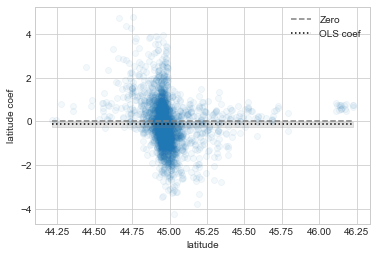

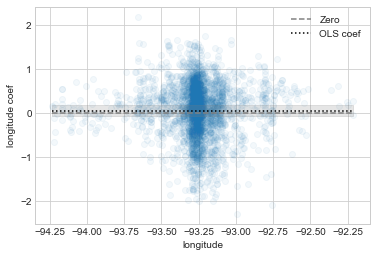

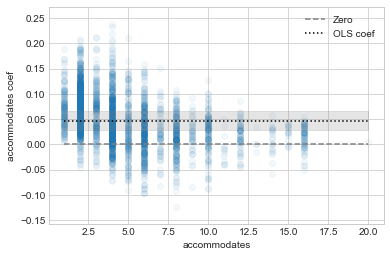

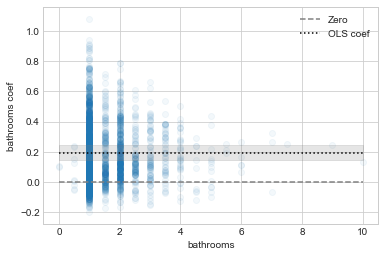

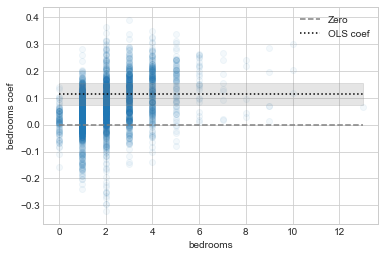

...

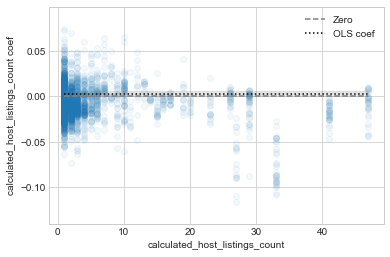

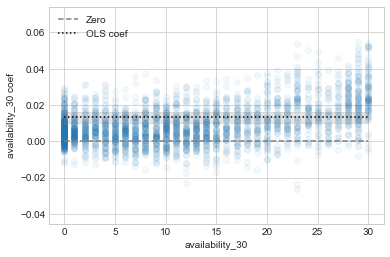

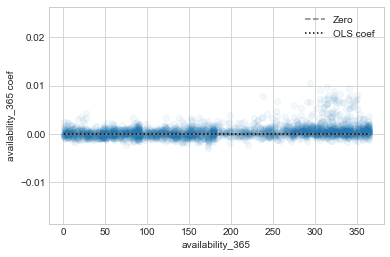

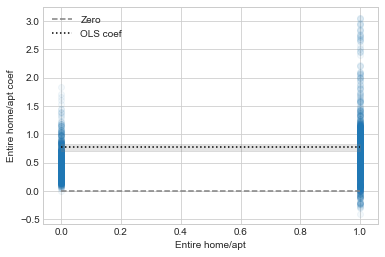

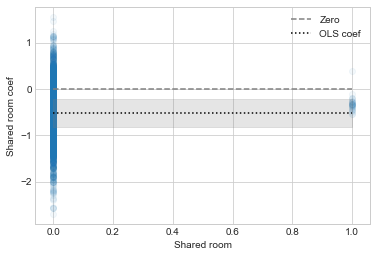

In [35]:
import plotcoefs

importlib.reload(plotcoefs)

plotcoefs.plot_coefs_by_self(features, dnn_coefs, results)

## Location gradiants

If we think location coefficients as a 2-dimensional vector then its norm is a measure of effect of location on price.

In [36]:
location_sensitivity = dnn_coefs[['latitude', 'longitude']].apply(
    np.linalg.norm, axis=1)

mapairbnb.plot(data, features, color_by=location_sensitivity,
               color_title='location sensitivity', hover=False)

We see listings that are very sensitive mixed among ones that are not. So location sensitivity must be driven by features other than location itself. 

In [37]:
location_sensitivity.name = 'loc_sens'
with_loc_sens = features.join(location_sensitivity).sort_values(by='loc_sens')

# Pick a few listings from the high end of the sensitivity sort
# and use them to get a location valuation plot
for p in np.linspace(0.9, 1, 5):

    i = int(p * (len(features)-1))

    fixed_app = with_loc_sens.iloc[i, :].drop('loc_sens')
    print(with_loc_sens.iloc[i, :].drop(['latitude', 'longitude']))

    location_only = fixcolumns.fix(data=features,
                                   fix_columns=features.columns[2:],
                                   fix_on=fixed_app.values)

    location_predicted = model.predict(
        scaler.transform(location_only)).flatten()

    mapairbnb.plot(data, features, color_by=np.exp(location_predicted),
                   color_title='Predicted price', hover=False, zoom=8).show()

accommodates                       6.000000
bathrooms                          1.000000
bedrooms                           2.000000
beds                               4.000000
minimum_nights                     1.000000
days_since_last_review             6.000000
number_of_reviews                  5.000000
reviews_per_month                  0.210000
calculated_host_listings_count     3.000000
availability_30                   15.000000
availability_365                  63.000000
Entire home/apt                    1.000000
Shared room                        0.000000
loc_sens                           1.875158
Name: 408, dtype: float64


accommodates                        6.000000
bathrooms                           2.500000
bedrooms                            2.000000
beds                                3.000000
minimum_nights                      2.000000
days_since_last_review              6.000000
number_of_reviews                  59.000000
reviews_per_month                   1.710000
calculated_host_listings_count      1.000000
availability_30                    21.000000
availability_365                  336.000000
Entire home/apt                     1.000000
Shared room                         0.000000
loc_sens                            2.037933
Name: 1004, dtype: float64


accommodates                       9.000000
bathrooms                          2.500000
bedrooms                           4.000000
beds                               4.000000
minimum_nights                     2.000000
days_since_last_review             7.000000
number_of_reviews                  6.000000
reviews_per_month                  0.610000
calculated_host_listings_count     1.000000
availability_30                    3.000000
availability_365                  73.000000
Entire home/apt                    1.000000
Shared room                        0.000000
loc_sens                           2.326712
Name: 502, dtype: float64


accommodates                        8.000000
bathrooms                           3.000000
bedrooms                            4.000000
beds                                4.000000
minimum_nights                      2.000000
days_since_last_review             14.000000
number_of_reviews                  64.000000
reviews_per_month                   1.970000
calculated_host_listings_count      1.000000
availability_30                    12.000000
availability_365                  296.000000
Entire home/apt                     1.000000
Shared room                         0.000000
loc_sens                            2.752473
Name: 1216, dtype: float64


accommodates                       12.000000
bathrooms                           4.000000
bedrooms                            5.000000
beds                                6.000000
minimum_nights                      3.000000
days_since_last_review             56.000000
number_of_reviews                  34.000000
reviews_per_month                   0.730000
calculated_host_listings_count      1.000000
availability_30                     4.000000
availability_365                  294.000000
Entire home/apt                     1.000000
Shared room                         0.000000
loc_sens                            4.851035
Name: 369, dtype: float64


Maps for high location sensitivity listings are generally better. Can we do any better still?

# Finally: location!
 

Let's build a model where location is not allowed to interact with anything else.

In [38]:
%%writefile loc_dnn.py
import tensorflow.keras as keras
from tf_r2 import R_squared


def build_model(
        input_shape,
        dropout=0.2,
        activation='relu',
        width=128,
        n_hidden=2,
        optimizer=keras.optimizers.SGD(0.05)):

    inputs = keras.Input(shape=input_shape)

    # Seperate the location on the first two indexes from the rest of
    # the inputs.
    loc = inputs[:, :2]
    for i in range(n_hidden):
        loc = keras.layers.Dense(width, activation=activation)(loc)
        loc = keras.layers.Dropout(dropout)(loc)
    loc = keras.layers.Dense(1)(loc)

    rest = inputs[:, 2:]
    for i in range(n_hidden):
        rest = keras.layers.Dense(width, activation=activation)(rest)
        rest = keras.layers.Dropout(dropout)(rest)
    rest = keras.layers.Dense(1)(rest)

    # Sum the two outputs so that they both have log price units.
    output = loc + rest

    loc_model = keras.Model(inputs=inputs, outputs=loc)
    full_model = keras.Model(inputs=inputs, outputs=output)

    full_model.compile(loss='mse',
                       optimizer=optimizer,
                       metrics=[R_squared])

    return full_model, loc_model


Writing loc_dnn.py


In [39]:
import loc_dnn

importlib.reload(loc_dnn)

model_all, loc_model = loc_dnn.build_model(X_train.shape[1:])

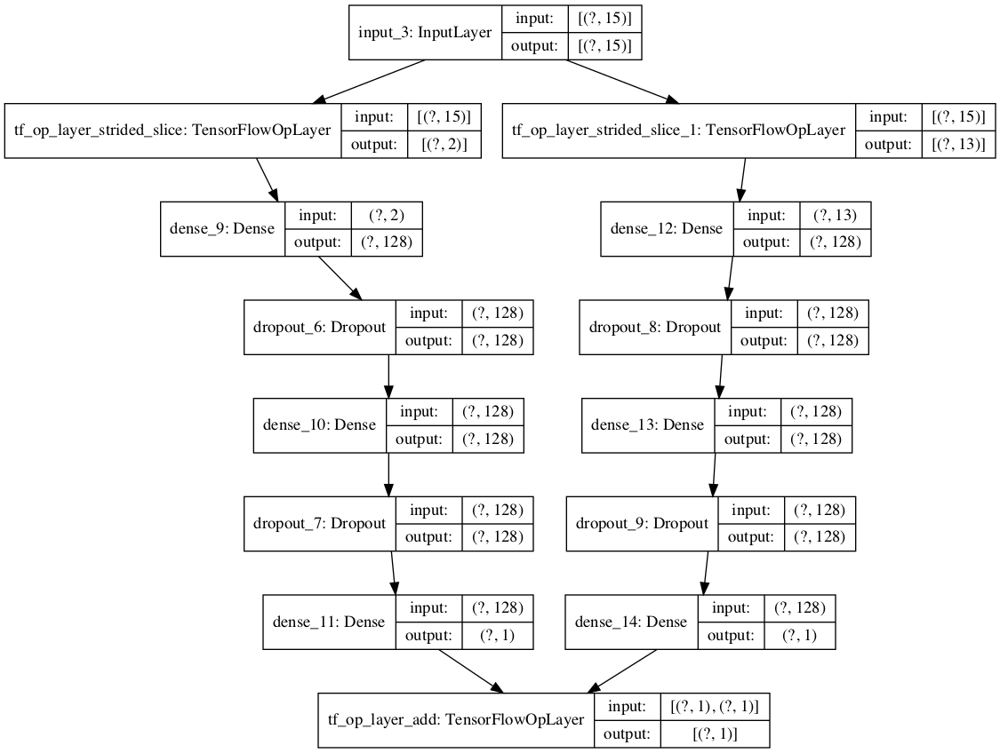

In [40]:
import tensorflow.keras as keras

keras.utils.plot_model(model_all, show_shapes=True)

In [43]:
history = simple_dnn.train_model(
    model_all,
    X_train_scaled, y_train, 
    X_test_scaled, y_test)

Train on 2208 samples, validate on 736 samples
Epoch 1/1000
2208/2208 [==============================] - 0s 189us/sample - loss: 0.2867 - R_squared: 0.6536 - val_loss: 0.3037 - val_R_squared: 0.6196
Epoch 2/1000
2208/2208 [==============================] - 0s 56us/sample - loss: 0.2837 - R_squared: 0.6634 - val_loss: 0.2987 - val_R_squared: 0.6193
Epoch 3/1000
2208/2208 [==============================] - 0s 65us/sample - loss: 0.2860 - R_squared: 0.6583 - val_loss: 0.3169 - val_R_squared: 0.6033
Epoch 4/1000
2208/2208 [==============================] - 0s 58us/sample - loss: 0.2803 - R_squared: 0.6669 - val_loss: 0.3017 - val_R_squared: 0.6222
Epoch 5/1000
2208/2208 [==============================] - 0s 59us/sample - loss: 0.2747 - R_squared: 0.6776 - val_loss: 0.3014 - val_R_squared: 0.6219
Epoch 6/1000
2208/2208 [==============================] - 0s 66us/sample - loss: 0.2805 - R_squared: 0.6648 - val_loss: 0.3000 - val_R_squared: 0.6236
Epoch 7/1000
2208/2208 [======================

2208/2208 [==============================] - 0s 67us/sample - loss: 0.2486 - R_squared: 0.7055 - val_loss: 0.3013 - val_R_squared: 0.6244
Epoch 55/1000
2208/2208 [==============================] - 0s 64us/sample - loss: 0.2491 - R_squared: 0.6976 - val_loss: 0.2911 - val_R_squared: 0.6342
Epoch 56/1000
2208/2208 [==============================] - 0s 66us/sample - loss: 0.2441 - R_squared: 0.7040 - val_loss: 0.2970 - val_R_squared: 0.6297
Epoch 57/1000
2208/2208 [==============================] - 0s 66us/sample - loss: 0.2430 - R_squared: 0.7099 - val_loss: 0.2971 - val_R_squared: 0.6284
Epoch 58/1000
2208/2208 [==============================] - 0s 64us/sample - loss: 0.2419 - R_squared: 0.7102 - val_loss: 0.2889 - val_R_squared: 0.6358
Epoch 59/1000
2208/2208 [==============================] - 0s 58us/sample - loss: 0.2486 - R_squared: 0.7023 - val_loss: 0.2921 - val_R_squared: 0.6339
Epoch 60/1000
2208/2208 [==============================] - 0s 67us/sample - loss: 0.2426 - R_squared: 

Epoch 108/1000
2208/2208 [==============================] - 0s 52us/sample - loss: 0.2260 - R_squared: 0.7313 - val_loss: 0.2842 - val_R_squared: 0.6435
Epoch 109/1000
2208/2208 [==============================] - 0s 49us/sample - loss: 0.2253 - R_squared: 0.7350 - val_loss: 0.2899 - val_R_squared: 0.6384
Epoch 110/1000
2208/2208 [==============================] - 0s 51us/sample - loss: 0.2293 - R_squared: 0.7304 - val_loss: 0.2901 - val_R_squared: 0.6371
Epoch 111/1000
2208/2208 [==============================] - 0s 50us/sample - loss: 0.2369 - R_squared: 0.7190 - val_loss: 0.3045 - val_R_squared: 0.6212
Epoch 112/1000
2208/2208 [==============================] - 0s 52us/sample - loss: 0.2309 - R_squared: 0.7239 - val_loss: 0.2896 - val_R_squared: 0.6372
Epoch 113/1000
2208/2208 [==============================] - 0s 51us/sample - loss: 0.2218 - R_squared: 0.7279 - val_loss: 0.2976 - val_R_squared: 0.6292
Epoch 114/1000
2208/2208 [==============================] - 0s 51us/sample - loss:

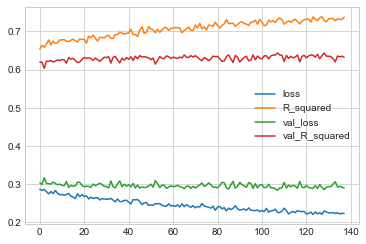

In [44]:
pd.DataFrame(history.history).plot()

In [45]:
import tf_r2

importlib.reload(tf_r2)

loc_DNN_r2 = dict(
    Train=tf_r2.R_squared(
        y_train, model_all.predict(X_train_scaled).flatten()).numpy(),
    Test=tf_r2.R_squared(
        y_test, model_all.predict(X_test_scaled).flatten()).numpy())

pd.DataFrame([OLS_r2, DNN_r2, loc_DNN_r2], index=['OLS R2', 'DNN R2', 'loc DNN R2'])

,Train,Test
OLS R2,0.601956,0.540067
DNN R2,0.751206,0.617876
loc DNN R2,0.768357,0.643809


In [46]:
location_predicted = loc_model.predict(scaler.transform(features)).flatten()

mapairbnb.plot(data, features, color_by=location_predicted,
               color_title='Diff log price', hover=False, zoom=8)